In [1]:
import folium
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline

In [2]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)

In [3]:
#Load the data
airbnb = pd.read_excel(r'C:\Users\gixi_\Downloads\Final Project - Airbnb Pricing/arr_df.xlsx')
airbnb.head(5)

,Unnamed: 0,Name,Lat,Lon,Numer_of_Guests,Price_per_night,Accommodation_Type,Star,labels,price_group,Final_Arrondissement,address
0,3,21 Tour Eiffel Appartement pour 2 personnes,48.84118,2.30754,2,90,Entire Place,5.0,9,2,15,"Traiteur Rose, Rue de Vaugirard, Quartier Neck..."
1,4,Appartement 2 pièces calme et spacieux,48.82545,2.31876,2,90,Entire Place,5.0,9,2,14,"Jean Moulin, Rue des Plantes, Quartier de Plai..."
2,5,Paris: Agréable petit studio à côté de la gare,48.84180,2.32222,2,90,Entire Place,5.0,9,2,15,"Monoprix, Rue du Départ, Quartier Necker, Pari..."
3,7,Charming studio near Montparnasse train station,48.83071,2.31601,2,90,Entire Place,5.0,9,2,14,"Villa Léone, Quartier de Plaisance, Paris 14e ..."
4,8,Lumineux Appartement Rénové,48.83244,2.32847,2,90,Entire Place,5.0,9,2,14,"41 P, Rue Boulard, Quartier du Petit-Montrouge..."


In [4]:
airbnb['geom'] = airbnb.apply(lambda row: (str(row.Lat),str(row.Lon)),axis=1)

In [5]:
airbnb['geom']

0       (48.84118, 2.30754)
1       (48.82545, 2.31876)
2        (48.8418, 2.32222)
3       (48.83071, 2.31601)
4       (48.83244, 2.32847)
               ...         
9655    (48.83634, 2.27718)
9656    (48.87046, 2.32238)
9657    (48.87365, 2.33423)
9658     (48.87985, 2.3284)
9659    (48.88056, 2.33286)
Name: geom, Length: 9660, dtype: object

In [6]:
arc_de_triomphe = (48.873756, 2.294946)
eiffel = (48.858093, 2.294694)
champs = (48.870502, 2.304897)
montmartre = (48.887691, 2.340607)
louvre = (48.860294, 2.338629)
notre_dame =(48.852966, 2.349902)

In [7]:
import geopy
from geopy.distance import geodesic
def distancer_eiffel(row):
    coords_1 = (row['Lat'], row['Lon'])
    eiffel = (48.858093, 2.294694)
    return geodesic(coords_1, eiffel).km
airbnb['eiffel'] = airbnb.apply(distancer_eiffel, axis=1)

In [8]:
import geopy
from geopy.distance import geodesic
def distancer_champs(row):
    coords_1 = (row['Lat'], row['Lon'])
    champs = (48.870502, 2.304897)
    return geodesic(coords_1, champs).km
airbnb['champs'] = airbnb.apply(distancer_champs, axis=1)

In [9]:
def distancer_arc_de_triomphe(row):
    coords_1 = (row['Lat'], row['Lon'])
    arc_de_triomphe = (48.873756, 2.294946)
    return geodesic(coords_1, arc_de_triomphe).km
airbnb['arc_de_triomphe'] = airbnb.apply(distancer_arc_de_triomphe, axis=1)

In [10]:
def distancer_louvre(row):
    coords_1 = (row['Lat'], row['Lon'])
    louvre = (48.860294, 2.338629)
    return geodesic(coords_1, louvre).km
airbnb['louvre'] = airbnb.apply(distancer_louvre, axis=1)

In [11]:
def distancer_montmartre(row):
    coords_1 = (row['Lat'], row['Lon'])
    montmartre = (48.887691, 2.340607)
    return geodesic(coords_1, montmartre).km
airbnb['montmartre'] = airbnb.apply(distancer_montmartre, axis=1)

In [12]:
def distancer_notre_dame(row):
    coords_1 = (row['Lat'], row['Lon'])
    notre_dame =(48.852966, 2.349902)
    return geodesic(coords_1, notre_dame).km
airbnb['notre_dame'] = airbnb.apply(distancer_notre_dame, axis=1)

In [13]:
#Double check all the columns
airbnb.columns

Index(['Unnamed: 0', 'Name', 'Lat', 'Lon', 'Numer_of_Guests',
       'Price_per_night', 'Accommodation_Type', 'Star', 'labels',
       'price_group', 'Final_Arrondissement', 'address', 'geom', 'eiffel',
       'champs', 'arc_de_triomphe', 'louvre', 'montmartre', 'notre_dame'],
      dtype='object')

In [14]:
#Check the null data in all columns as well as the data types
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9660 entries, 0 to 9659
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            9660 non-null   int64  
 1   Name                  9659 non-null   object 
 2   Lat                   9660 non-null   float64
 3   Lon                   9660 non-null   float64
 4   Numer_of_Guests       9660 non-null   int64  
 5   Price_per_night       9660 non-null   int64  
 6   Accommodation_Type    9660 non-null   object 
 7   Star                  9660 non-null   float64
 8   labels                9660 non-null   int64  
 9   price_group           9660 non-null   int64  
 10  Final_Arrondissement  9660 non-null   int64  
 11  address               9660 non-null   object 
 12  geom                  9660 non-null   object 
 13  eiffel                9660 non-null   float64
 14  champs                9660 non-null   float64
 15  arc_de_triomphe      

In [15]:
airbnb.drop(['Unnamed: 0',],axis =1, inplace = True)

In [16]:
#Remove all null row
airbnb.dropna(how='any', inplace = True)
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9659 entries, 0 to 9659
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Name                  9659 non-null   object 
 1   Lat                   9659 non-null   float64
 2   Lon                   9659 non-null   float64
 3   Numer_of_Guests       9659 non-null   int64  
 4   Price_per_night       9659 non-null   int64  
 5   Accommodation_Type    9659 non-null   object 
 6   Star                  9659 non-null   float64
 7   labels                9659 non-null   int64  
 8   price_group           9659 non-null   int64  
 9   Final_Arrondissement  9659 non-null   int64  
 10  address               9659 non-null   object 
 11  geom                  9659 non-null   object 
 12  eiffel                9659 non-null   float64
 13  champs                9659 non-null   float64
 14  arc_de_triomphe       9659 non-null   float64
 15  louvre               

In [17]:
#Plot all the labels on the map
import matplotlib.colors as colors
locations = airbnb[['Lat','Lon','Final_Arrondissement']]
map = folium.Map(location=[locations.Lat.mean(), locations.Lon.mean()], zoom_start=11, control_scale=True)

x = np.arange(20)
ys = [i + x + (i*x)**2 for i in range(20)]
colors_array = cm.gnuplot(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

for lat, lng, cluster in zip(locations['Lat'], locations['Lon'],  locations['Final_Arrondissement']):
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=5,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.9).add_to(map)
    

In [18]:
map

In [19]:
#Print the updated dataset
airbnb

,Name,Lat,Lon,Numer_of_Guests,Price_per_night,Accommodation_Type,Star,labels,price_group,Final_Arrondissement,address,geom,eiffel,champs,arc_de_triomphe,louvre,montmartre,notre_dame
0,21 Tour Eiffel Appartement pour 2 personnes,48.84118,2.30754,2,90,Entire Place,5.0,9,2,15,"Traiteur Rose, Rue de Vaugirard, Quartier Neck...","(48.84118, 2.30754)",2.103905,3.266573,3.738697,3.118338,5.713086,3.374152
1,Appartement 2 pièces calme et spacieux,48.82545,2.31876,2,90,Entire Place,5.0,9,2,14,"Jean Moulin, Rue des Plantes, Quartier de Plai...","(48.82545, 2.31876)",4.037124,5.112359,5.649120,4.140257,7.104868,3.819601
2,Paris: Agréable petit studio à côté de la gare,48.84180,2.32222,2,90,Entire Place,5.0,9,2,15,"Monoprix, Rue du Départ, Quartier Necker, Pari...","(48.8418, 2.32222)",2.713677,3.435685,4.078536,2.383290,5.278701,2.381135
3,Charming studio near Montparnasse train station,48.83071,2.31601,2,90,Entire Place,5.0,9,2,14,"Villa Léone, Quartier de Plaisance, Paris 14e ...","(48.83071, 2.31601)",3.423595,4.499674,5.030419,3.685095,6.588715,3.509239
4,Lumineux Appartement Rénové,48.83244,2.32847,2,90,Entire Place,5.0,9,2,14,"41 P, Rue Boulard, Quartier du Petit-Montrouge...","(48.83244, 2.32847)",3.779459,4.572650,5.211836,3.186033,6.208505,2.772218
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9655,Cosy Studio - Parc des expositions / Tour Eiff...,48.83634,2.27718,2,84,Entire Place,2.5,3,2,15,"Balard, Boulevard du Général Martial Valin, Qu...","(48.83634, 2.27718)",2.739402,4.309307,4.360387,5.237931,7.366778,5.648881
9656,Madeleine Area Charming & Stylish Studio,48.87046,2.32238,3,127,Entire Place,2.0,7,3,8,"3, Rue de Surène, Quartier de la Madeleine, Pa...","(48.87046, 2.32238)",2.453112,1.282585,2.045636,1.642976,2.336505,2.804067
9657,Opéra 2,48.87365,2.33423,6,150,Entire Place,3.0,7,3,9,"6, Cité d'Antin, Quartier de la Chaussée-d'Ant...","(48.87365, 2.33423)",3.377427,2.180131,2.881766,1.519943,1.630012,2.571611
9658,Sweet Inn | Charming 1BR Apt. in Saint Lazare,48.87985,2.32840,3,156,Entire Place,3.0,7,3,8,"8, Rue de Liège, Quartier de l'Europe, Paris 8...","(48.87985, 2.3284)",3.459602,2.013218,2.545781,2.300597,1.249752,3.380371


<AxesSubplot:>

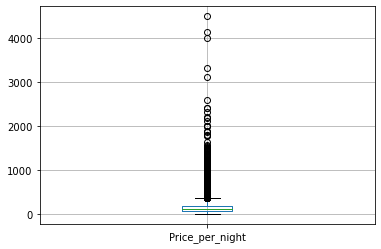

In [20]:
#Plot the price per night to check the outliers
airbnb.boxplot('Price_per_night')

In [21]:
#Remove the price outliers
airbnb.drop(airbnb[airbnb['Price_per_night'] > 5000].index, inplace=True)

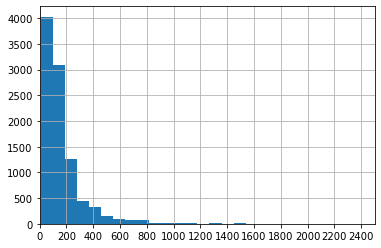

In [22]:
#Plot the price_per_night as histogram
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.pyplot import figure
fig, ax = plt.subplots()
airbnb["Price_per_night"].hist(bins=50)
plt.xlim(xmax=2500)
plt.xlim(xmin=0)
ax.set_xticks([0,200,400,600,800,1000,1200,1400,1600,1800,2000,2200,2400])

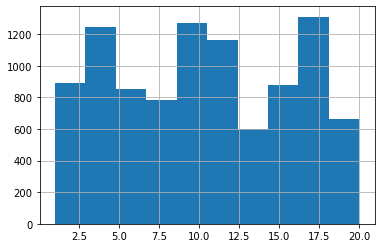

In [23]:
#Create a histogram for labels
fig, ax = plt.subplots()
airbnb["Final_Arrondissement"].hist()
plt.show()


In [24]:
#Create bins for prices per night
bins = [0, 50, 100, 300, np.inf]
labels = [1,2,3,4]
airbnb['price_group'] = pd.cut(airbnb["Price_per_night"],bins=bins, labels=labels)


In [25]:
#Print the price_group which will be considered for target variable for the later models
airbnb['price_group']

0       2
1       2
2       2
3       2
4       2
       ..
9655    2
9656    3
9657    3
9658    3
9659    2
Name: price_group, Length: 9659, dtype: category
Categories (4, int64): [1 < 2 < 3 < 4]

In [26]:
#Check value counts for all labels
airbnb.groupby('price_group')[['Name']].agg('count')

,Name
price_group,
1,713
2,3316
3,4497
4,1133


In [27]:
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Entire') == True] = 'Entire Place'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('hotel') == True] = 'Hotel Rooms'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Shared') == True] = 'Shared Rooms'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Private') == True] = 'Private Rooms'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Hotel') == True] = 'Hotel Rooms'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Tiny') == True] = 'Entire Place'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Boat') == True] = 'Entire Place'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'].str.contains('Tower') == True] = 'Entire Place'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'] == 'Room in serviced apartment'] = 'Private Rooms'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'] == 'Room in bed and breakfast'] = 'Private Rooms'
airbnb['Accommodation_Type'].loc[airbnb['Accommodation_Type'] == 'Room in hostel'] = 'Hotel Rooms'

C:\Users\gixi_\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\gixi_\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\gixi_\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-

In [28]:
#Plot all the labels on the map
import matplotlib.colors as colors
locations = airbnb[['Lat','Lon','price_group']]
map1 = folium.Map(location=[locations.Lat.mean(), locations.Lon.mean()], zoom_start=11, control_scale=True)

x = np.arange(4)
ys = [i + x + (i*x)**2 for i in range(4)]
colors_array1 = cm.gnuplot(np.linspace(0, 1, len(ys)))
rainbow1 = [colors.rgb2hex(i) for i in colors_array1]

for lat, lng, cluster in zip(locations['Lat'], locations['Lon'],  locations['price_group']):
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=5,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow1[cluster-1],
        fill_opacity=0.9).add_to(map1)
    
map1

In [29]:
rainbow1
#black,purple,orange,yellow

['#000000', '#9309dd', '#d04c00', '#ffff00']

In [30]:
airbnb.drop('Star', axis = 1, inplace = True)

In [31]:
airbnb['Accommodation_Type'].unique()

array(['Entire Place', 'Private Rooms', 'Hotel Rooms', 'Shared Rooms'],
      dtype=object)

<AxesSubplot:>

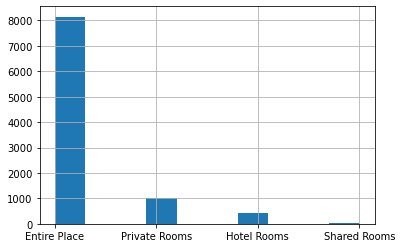

In [32]:
airbnb["Accommodation_Type"].hist()

In [33]:
airbnb_dummies = pd.get_dummies(airbnb, columns=['Accommodation_Type'])
airbnb_dummies


,Name,Lat,Lon,Numer_of_Guests,Price_per_night,labels,price_group,Final_Arrondissement,address,geom,eiffel,champs,arc_de_triomphe,louvre,montmartre,notre_dame,Accommodation_Type_Entire Place,Accommodation_Type_Hotel Rooms,Accommodation_Type_Private Rooms,Accommodation_Type_Shared Rooms
0,21 Tour Eiffel Appartement pour 2 personnes,48.84118,2.30754,2,90,9,2,15,"Traiteur Rose, Rue de Vaugirard, Quartier Neck...","(48.84118, 2.30754)",2.103905,3.266573,3.738697,3.118338,5.713086,3.374152,1,0,0,0
1,Appartement 2 pièces calme et spacieux,48.82545,2.31876,2,90,9,2,14,"Jean Moulin, Rue des Plantes, Quartier de Plai...","(48.82545, 2.31876)",4.037124,5.112359,5.649120,4.140257,7.104868,3.819601,1,0,0,0
2,Paris: Agréable petit studio à côté de la gare,48.84180,2.32222,2,90,9,2,15,"Monoprix, Rue du Départ, Quartier Necker, Pari...","(48.8418, 2.32222)",2.713677,3.435685,4.078536,2.383290,5.278701,2.381135,1,0,0,0
3,Charming studio near Montparnasse train station,48.83071,2.31601,2,90,9,2,14,"Villa Léone, Quartier de Plaisance, Paris 14e ...","(48.83071, 2.31601)",3.423595,4.499674,5.030419,3.685095,6.588715,3.509239,1,0,0,0
4,Lumineux Appartement Rénové,48.83244,2.32847,2,90,9,2,14,"41 P, Rue Boulard, Quartier du Petit-Montrouge...","(48.83244, 2.32847)",3.779459,4.572650,5.211836,3.186033,6.208505,2.772218,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9655,Cosy Studio - Parc des expositions / Tour Eiff...,48.83634,2.27718,2,84,3,2,15,"Balard, Boulevard du Général Martial Valin, Qu...","(48.83634, 2.27718)",2.739402,4.309307,4.360387,5.237931,7.366778,5.648881,1,0,0,0
9656,Madeleine Area Charming & Stylish Studio,48.87046,2.32238,3,127,7,3,8,"3, Rue de Surène, Quartier de la Madeleine, Pa...","(48.87046, 2.32238)",2.453112,1.282585,2.045636,1.642976,2.336505,2.804067,1,0,0,0
9657,Opéra 2,48.87365,2.33423,6,150,7,3,9,"6, Cité d'Antin, Quartier de la Chaussée-d'Ant...","(48.87365, 2.33423)",3.377427,2.180131,2.881766,1.519943,1.630012,2.571611,1,0,0,0
9658,Sweet Inn | Charming 1BR Apt. in Saint Lazare,48.87985,2.32840,3,156,7,3,8,"8, Rue de Liège, Quartier de l'Europe, Paris 8...","(48.87985, 2.3284)",3.459602,2.013218,2.545781,2.300597,1.249752,3.380371,1,0,0,0


In [34]:
airbnb_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9659 entries, 0 to 9659
Data columns (total 20 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   Name                              9659 non-null   object  
 1   Lat                               9659 non-null   float64 
 2   Lon                               9659 non-null   float64 
 3   Numer_of_Guests                   9659 non-null   int64   
 4   Price_per_night                   9659 non-null   int64   
 5   labels                            9659 non-null   int64   
 6   price_group                       9659 non-null   category
 7   Final_Arrondissement              9659 non-null   int64   
 8   address                           9659 non-null   object  
 9   geom                              9659 non-null   object  
 10  eiffel                            9659 non-null   float64 
 11  champs                            9659 non-null   float6

In [35]:
airbnb_dummies.drop(['Name','Price_per_night','Lat','Lon','address','geom'], axis = 1, inplace = True)
airbnb_dummies

,Numer_of_Guests,labels,price_group,Final_Arrondissement,eiffel,champs,arc_de_triomphe,louvre,montmartre,notre_dame,Accommodation_Type_Entire Place,Accommodation_Type_Hotel Rooms,Accommodation_Type_Private Rooms,Accommodation_Type_Shared Rooms
0,2,9,2,15,2.103905,3.266573,3.738697,3.118338,5.713086,3.374152,1,0,0,0
1,2,9,2,14,4.037124,5.112359,5.649120,4.140257,7.104868,3.819601,1,0,0,0
2,2,9,2,15,2.713677,3.435685,4.078536,2.383290,5.278701,2.381135,1,0,0,0
3,2,9,2,14,3.423595,4.499674,5.030419,3.685095,6.588715,3.509239,1,0,0,0
4,2,9,2,14,3.779459,4.572650,5.211836,3.186033,6.208505,2.772218,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9655,2,3,2,15,2.739402,4.309307,4.360387,5.237931,7.366778,5.648881,1,0,0,0
9656,3,7,3,8,2.453112,1.282585,2.045636,1.642976,2.336505,2.804067,1,0,0,0
9657,6,7,3,9,3.377427,2.180131,2.881766,1.519943,1.630012,2.571611,1,0,0,0
9658,3,7,3,8,3.459602,2.013218,2.545781,2.300597,1.249752,3.380371,1,0,0,0


In [37]:
airbnb_dummies.drop(['labels'], axis = 1, inplace = True)
airbnb_dummies

,Numer_of_Guests,price_group,Final_Arrondissement,eiffel,champs,arc_de_triomphe,louvre,montmartre,notre_dame,Accommodation_Type_Entire Place,Accommodation_Type_Hotel Rooms,Accommodation_Type_Private Rooms,Accommodation_Type_Shared Rooms
0,2,2,15,2.103905,3.266573,3.738697,3.118338,5.713086,3.374152,1,0,0,0
1,2,2,14,4.037124,5.112359,5.649120,4.140257,7.104868,3.819601,1,0,0,0
2,2,2,15,2.713677,3.435685,4.078536,2.383290,5.278701,2.381135,1,0,0,0
3,2,2,14,3.423595,4.499674,5.030419,3.685095,6.588715,3.509239,1,0,0,0
4,2,2,14,3.779459,4.572650,5.211836,3.186033,6.208505,2.772218,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9655,2,2,15,2.739402,4.309307,4.360387,5.237931,7.366778,5.648881,1,0,0,0
9656,3,3,8,2.453112,1.282585,2.045636,1.642976,2.336505,2.804067,1,0,0,0
9657,6,3,9,3.377427,2.180131,2.881766,1.519943,1.630012,2.571611,1,0,0,0
9658,3,3,8,3.459602,2.013218,2.545781,2.300597,1.249752,3.380371,1,0,0,0


In [38]:
x = airbnb_dummies.drop('price_group', axis = 1)
y = airbnb_dummies['price_group']

In [39]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [40]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import ComplementNB
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import roc_auc_score
from sklearn.calibration import CalibratedClassifierCV
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.datasets import make_classification
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import precision_score

In [41]:
#Create a function to return the predictions as well as the heatmap for all models
def generate_results(model, predictions, name):
    cl_rep = classification_report(y_test, predictions)
    print("\nThe classification report for " + name + " is:", cl_rep, sep = "\n")
    cm_model = confusion_matrix(y_test, predictions)
    plt.figure(figsize = (8, 6))
    sns.heatmap(cm_model, annot = True, cmap = 'Blues', annot_kws = {'size': 15}, square = True)
    plt.title('Confusion Matrix for ' + name, size = 15)
    plt.xticks(size = 15)
    plt.yticks(size = 15)
    plt.show()

## Random Forest Classifier

The accuracy of the Random Forest Classifier is: 63.25051759834368 %

The classification report for Random Forest Classifier is:
              precision    recall  f1-score   support

           1       0.58      0.44      0.50       142
           2       0.60      0.58      0.59       677
           3       0.66      0.71      0.68       906
           4       0.66      0.60      0.63       207

    accuracy                           0.63      1932
   macro avg       0.62      0.58      0.60      1932
weighted avg       0.63      0.63      0.63      1932



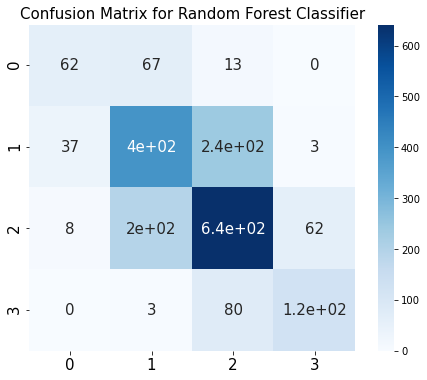

In [42]:
rfc = RandomForestClassifier()
rfc.fit(x_train, y_train)
y_pred_rfc = rfc.predict(x_test)
acc_rfc = rfc.score(x_test, y_test)
print('The accuracy of the Random Forest Classifier is:', acc_rfc * 100, '%')
generate_results(rfc, y_pred_rfc, 'Random Forest Classifier')

## Model ComplementNB

The accuracy of the  ComplementNB is: 56.31469979296067 %

The classification report for ComplementNB is:
              precision    recall  f1-score   support

           1       0.47      0.11      0.17       142
           2       0.53      0.74      0.62       677
           3       0.68      0.47      0.56       906
           4       0.44      0.70      0.54       207

    accuracy                           0.56      1932
   macro avg       0.53      0.50      0.47      1932
weighted avg       0.59      0.56      0.55      1932



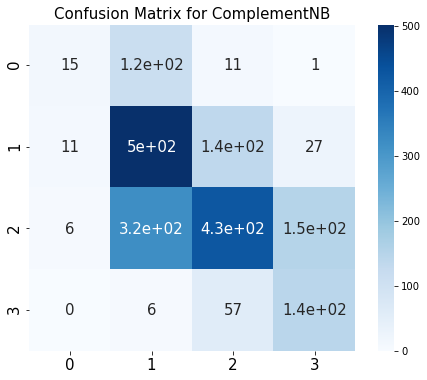

In [43]:
clf = ComplementNB()
clf.fit(x, y)
y_pred_cnb = clf.predict(x_test)
acc_clf = clf.score(x_test, y_test)
print('The accuracy of the  ComplementNB is:', acc_clf * 100, '%')
generate_results(rfc, y_pred_cnb, 'ComplementNB')

##  SGDClassifier

The accuracy of the  SGDClassifier is: 63.50931677018633 %

The classification report for SGDClassifier is:
              precision    recall  f1-score   support

           1       0.76      0.11      0.20       142
           2       0.62      0.57      0.60       677
           3       0.63      0.83      0.71       906
           4       0.85      0.34      0.48       207

    accuracy                           0.64      1932
   macro avg       0.72      0.46      0.50      1932
weighted avg       0.66      0.64      0.61      1932



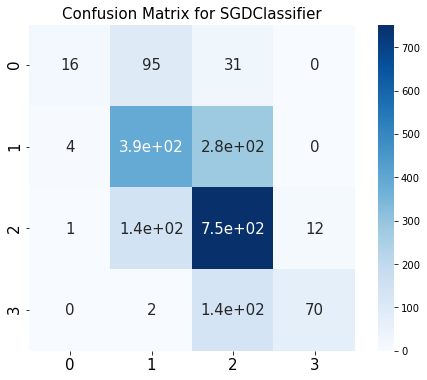

0.8372333948309958

In [44]:
lr = SGDClassifier(loss='hinge',class_weight='balanced')
clf1 =lr.fit(x, y)
calibrator = CalibratedClassifierCV(clf1, cv='prefit')
model=calibrator.fit(x, y)
# Always scale the input. The most convenient way is to use a pipeline.
y_pred_sgd = model.predict(x_test)
acc_clf = model.score(x_test, y_test)
print('The accuracy of the  SGDClassifier is:', acc_clf * 100, '%')
generate_results(rfc, y_pred_sgd, 'SGDClassifier')
roc_auc_score(y, model.predict_proba(x), average='macro',multi_class='ovr')

## PassiveAggressiveClassifier

In [45]:
# Creating model
model_passagg = PassiveAggressiveClassifier(C = 0.5, random_state = 5)
# Fitting model
model_passagg.fit(x_train, y_train)
# Making prediction on test set
y_pred_pag = model_passagg.predict(x_test)
# Model evaluation
print(f"Test Set Accuracy : {accuracy_score(y_test, y_pred_pag) * 100} %\n\n")
print(f"Classification Report : \n\n{classification_report(y_test, y_pred_pag,zero_division=1)}")

Test Set Accuracy : 46.48033126293996 %


Classification Report : 

              precision    recall  f1-score   support

           1       0.85      0.08      0.14       142
           2       0.45      0.97      0.61       677
           3       0.66      0.10      0.18       906
           4       0.45      0.68      0.54       207

    accuracy                           0.46      1932
   macro avg       0.60      0.46      0.37      1932
weighted avg       0.58      0.46      0.36      1932



# Gradient Boosting Classifier


Confusion Matrix:
 [[ 66  67   9   0]
 [ 34 429 214   0]
 [  5 174 684  43]
 [  0   2  80 125]]
Accuracy: 67.0 %
Precision Score: 67.0 %
Recall Score: 67.0 %
F1 Score: 67.0 %

The classification report for Gradient Boosting Classifier is:
              precision    recall  f1-score   support

           1       0.63      0.46      0.53       142
           2       0.64      0.63      0.64       677
           3       0.69      0.75      0.72       906
           4       0.74      0.60      0.67       207

    accuracy                           0.67      1932
   macro avg       0.68      0.61      0.64      1932
weighted avg       0.67      0.67      0.67      1932



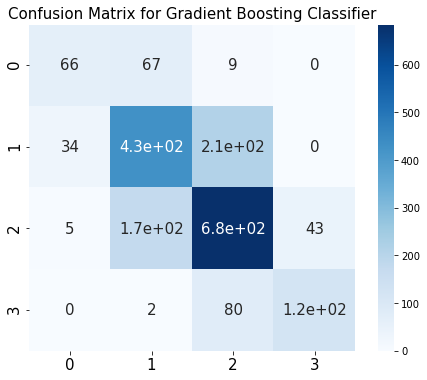

In [46]:
from sklearn import datasets
from sklearn import metrics
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
model = GradientBoostingClassifier()
model.fit(x_train, y_train)
y_pred_gbc = model.predict(x_test)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_gbc))
print("Accuracy:", round(accuracy_score(y_test, y_pred_gbc),2)*100,"%")
print("Precision Score:", round(precision_score(y_test, y_pred_gbc, average="weighted"),2)*100,"%")
print("Recall Score:", round(recall_score(y_test, y_pred_gbc, average="weighted"),2)*100,"%")
print("F1 Score:", round(f1_score(y_test, y_pred_gbc, average="weighted"), 2)*100,"%")
generate_results(model, y_pred_gbc, 'Gradient Boosting Classifier')

# Bagging Classifier

Confusion Matrix:
 [[ 63  69  10   0]
 [ 35 395 244   3]
 [  9 196 642  59]
 [  0   4  76 127]]
Accuracy: 64.0 %
Precision Score: 63.0 %
Recall Score: 64.0 %
F1 Score: 63.0 %

The classification report for Bagging Classifier is:
              precision    recall  f1-score   support

           1       0.59      0.44      0.51       142
           2       0.59      0.58      0.59       677
           3       0.66      0.71      0.68       906
           4       0.67      0.61      0.64       207

    accuracy                           0.64      1932
   macro avg       0.63      0.59      0.61      1932
weighted avg       0.63      0.64      0.63      1932



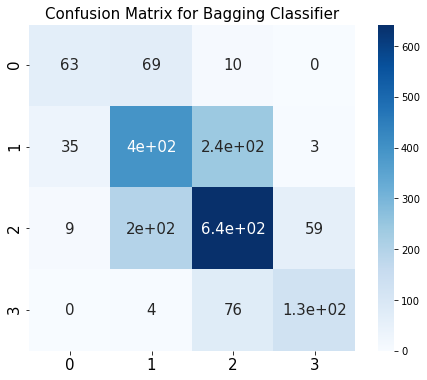

In [47]:
from sklearn.tree import DecisionTreeClassifier , plot_tree
from sklearn.ensemble import BaggingClassifier
bag_model = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=600, max_samples=0.8,
bootstrap=True,oob_score=True,random_state=0)
bag_model.fit(x_train, y_train)
bag_model.oob_score_
bag_model.score(x_test, y_test)
y_pred_bg = bag_model.predict(x_test)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_bg))
print("Accuracy:", round(accuracy_score(y_test, y_pred_bg),2)*100,"%")
print("Precision Score:", round(precision_score(y_test, y_pred_bg, average="weighted"),2)*100,"%")
print("Recall Score:", round(recall_score(y_test, y_pred_bg, average="weighted"),2)*100,"%")
print("F1 Score:", round(f1_score(y_test, y_pred_bg, average="weighted"), 2)*100,"%")
generate_results(bag_model, y_pred_bg, 'Bagging Classifier')

# Testing

In [48]:
test_x_1 = airbnb_dummies.loc[[21]]
test_x_1.drop('price_group', axis = 1, inplace = True)

In [49]:
airbnb.loc[[21]]

,Name,Lat,Lon,Numer_of_Guests,Price_per_night,Accommodation_Type,labels,price_group,Final_Arrondissement,address,geom,eiffel,champs,arc_de_triomphe,louvre,montmartre,notre_dame
21,Charmant studio avec terrasse,48.88109,2.3465,2,90,Entire Place,12,2,9,"Condorcet - Trudaine, Rue Marguerite de Rochec...","(48.88109, 2.3465)",4.580961,3.271004,3.8685,2.383661,0.851863,3.137534


In [50]:
airbnb_dummies.columns

Index(['Numer_of_Guests', 'price_group', 'Final_Arrondissement', 'eiffel',
       'champs', 'arc_de_triomphe', 'louvre', 'montmartre', 'notre_dame',
       'Accommodation_Type_Entire Place', 'Accommodation_Type_Hotel Rooms',
       'Accommodation_Type_Private Rooms', 'Accommodation_Type_Shared Rooms'],
      dtype='object')

In [58]:
#285 - 350 eur/night
cosy = pd.DataFrame({'Numer_of_Guests':4, 'Final_Arrondissement': 18, 'eiffel':6.1,
       'champs':4.5, 'arc_de_triomphe':4.1, 'louvre':3.2, 'montmartre':2, 'notre_dame':4.2,
       'Accommodation_Type_Entire Place':1, 'Accommodation_Type_Hotel Rooms':0,
       'Accommodation_Type_Private Rooms':0, 'Accommodation_Type_Shared Rooms':0}, index=[0])

In [59]:
cosy

,Numer_of_Guests,Final_Arrondissement,eiffel,champs,arc_de_triomphe,louvre,montmartre,notre_dame,Accommodation_Type_Entire Place,Accommodation_Type_Hotel Rooms,Accommodation_Type_Private Rooms,Accommodation_Type_Shared Rooms
0,4,18,6.1,4.5,4.1,3.2,2,4.2,1,0,0,0


In [60]:
#Price 550 EUR/night
jaccuzi = pd.DataFrame({'Numer_of_Guests':7,'Final_Arrondissement': 15, 'eiffel':1.4,
       'champs':2.8, 'arc_de_triomphe':3.6, 'louvre':3.6, 'montmartre':6.3, 'notre_dame':4.1,
       'Accommodation_Type_Entire Place':1, 'Accommodation_Type_Hotel Rooms':0,
       'Accommodation_Type_Private Rooms':0, 'Accommodation_Type_Shared Rooms':0}, index=[0])

In [61]:
#Create a function to return the prediction results for 5 models:
def generate_result_table(df):
    result = pd.DataFrame({'Rfc' : rfc.predict(df), 'Clf': clf.predict(df), 'Passive_Aggressive': model_passagg.predict(df), 'SGD Classifier': model.predict(df),'Gradient Boosting':model.predict(df),'Bagging Classifier':bag_model.predict(df)})
    price_group = pd.DataFrame({"1":"< 50 EUR", "2":"< 100 EUR","3":"< 300 EUR","4":"Over 3O0 EUR"},index=[0])
    print(price_group)
    return result


In [62]:
generate_result_table(jaccuzi)

          1          2          3             4
0  < 50 EUR  < 100 EUR  < 300 EUR  Over 3O0 EUR


,Rfc,Clf,Passive_Aggressive,SGD Classifier,Gradient Boosting,Bagging Classifier
0,4,4,4,4,4,3


In [63]:
generate_result_table(cosy)

          1          2          3             4
0  < 50 EUR  < 100 EUR  < 300 EUR  Over 3O0 EUR


,Rfc,Clf,Passive_Aggressive,SGD Classifier,Gradient Boosting,Bagging Classifier
0,3,2,2,3,3,2


In [64]:
generate_result_table(test_x_1)

          1          2          3             4
0  < 50 EUR  < 100 EUR  < 300 EUR  Over 3O0 EUR


,Rfc,Clf,Passive_Aggressive,SGD Classifier,Gradient Boosting,Bagging Classifier
0,2,2,2,2,2,2


In [56]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

print('RandomForestClassifier')
print('====================')
print('Confusion matrix')
print(confusion_matrix(y_test, y_pred_rfc))
print('-------------------')
print(f'Accuracy = {accuracy_score(y_test, y_pred_rfc).round(4)}')
print(f'Precision = {precision_score(y_test, y_pred_rfc, average="macro", zero_division=0).round(4)}')
print(f'Recall = {recall_score(y_test, y_pred_rfc,average="macro").round(4)}')
print(f'F1 score = {f1_score(y_test, y_pred_rfc, average="macro").round(4)}')
print('\n')


print('SGDCClassifier')
print('====================')
print('Confusion matrix')
print(confusion_matrix(y_test, y_pred_sgd))
print('-------------------')
print(f'Accuracy = {accuracy_score(y_test, y_pred_sgd).round(4)}')
print(f'Precision = {precision_score(y_test, y_pred_sgd, average="macro", zero_division=0).round(4)}')
print(f'Recall = {recall_score(y_test, y_pred_sgd, average="macro").round(4)}')
print(f'F1 score = {f1_score(y_test, y_pred_sgd, average="macro").round(4)}')
print('\n')


print('ComplementNB')
print('====================')
print('Confusion matrix')
print(confusion_matrix(y_test, y_pred_cnb))
print('-------------------')
print(f'Accuracy = {accuracy_score(y_test, y_pred_cnb).round(4)}')
print(f'Precision = {precision_score(y_test, y_pred_cnb, average="macro", zero_division=0).round(4)}')
print(f'Recall = {recall_score(y_test, y_pred_cnb, average="macro").round(4)}')
print(f'F1 score = {f1_score(y_test, y_pred_cnb, average="macro").round(4)}')
print('\n')


print('PassiveAggressiveClassifier')
print('====================')
print('Confusion matrix')
print(confusion_matrix(y_test, y_pred_pag))
print('-------------------')
print(f'Accuracy = {accuracy_score(y_test, y_pred_pag).round(4)}')
print(f'Precision = {precision_score(y_test, y_pred_pag, average="macro", zero_division=0).round(4)}')
print(f'Recall = {recall_score(y_test, y_pred_pag, average="macro").round(4)}')
print(f'F1 score = {f1_score(y_test, y_pred_pag, average="macro").round(4)}')
print('\n')

print('Gradient Boosting Classifier')
print('====================')
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_gbc))
print("Accuracy:", round(accuracy_score(y_test, y_pred_gbc),2)*100,"%")
print("Precision Score:", round(precision_score(y_test, y_pred_gbc, average="weighted"),2)*100,"%")
print("Recall Score:", round(recall_score(y_test, y_pred_gbc, average="weighted"),2)*100,"%")
print("F1 Score:", round(f1_score(y_test, y_pred_gbc, average="weighted"), 2)*100,"%")
print('\n')

print('Bagging Classifier')
print('====================')
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_bg))
print("Accuracy:", round(accuracy_score(y_test, y_pred_bg),2)*100,"%")
print("Precision Score:", round(precision_score(y_test, y_pred_bg, average="weighted"),2)*100,"%")
print("Recall Score:", round(recall_score(y_test, y_pred_bg, average="weighted"),2)*100,"%")
print("F1 Score:", round(f1_score(y_test, y_pred_bg, average="weighted"), 2)*100,"%")


RandomForestClassifier
Confusion matrix
[[ 62  67  13   0]
 [ 37 395 242   3]
 [  8 195 641  62]
 [  0   3  80 124]]
-------------------
Accuracy = 0.6325
Precision = 0.6227
Recall = 0.5817
F1 score = 0.5991


SGDCClassifier
Confusion matrix
[[ 16  95  31   0]
 [  4 389 284   0]
 [  1 141 752  12]
 [  0   2 135  70]]
-------------------
Accuracy = 0.6351
Precision = 0.7154
Recall = 0.4639
F1 score = 0.4977


ComplementNB
Confusion matrix
[[ 15 115  11   1]
 [ 11 502 137  27]
 [  6 321 427 152]
 [  0   6  57 144]]
-------------------
Accuracy = 0.5631
Precision = 0.5302
Recall = 0.5035
F1 score = 0.4724


PassiveAggressiveClassifier
Confusion matrix
[[ 11 130   0   1]
 [  2 654   8  13]
 [  0 656  92 158]
 [  0  27  39 141]]
-------------------
Accuracy = 0.4648
Precision = 0.6011
Recall = 0.4565
F1 score = 0.3676


Gradient Boosting Classifier
Confusion Matrix:
 [[ 66  67   9   0]
 [ 34 429 214   0]
 [  5 174 684  43]
 [  0   2  80 125]]
Accuracy: 67.0 %
Precision Score: 67.0 %
Recall 

Feature ranking:
1. feature 0 (0.187835)
2. feature 5 (0.121625)
3. feature 2 (0.121594)
4. feature 7 (0.116971)
5. feature 3 (0.116501)
6. feature 4 (0.114910)
7. feature 6 (0.114010)
8. feature 1 (0.048006)
9. feature 10 (0.028120)
10. feature 9 (0.013682)
11. feature 8 (0.013484)
12. feature 11 (0.003263)


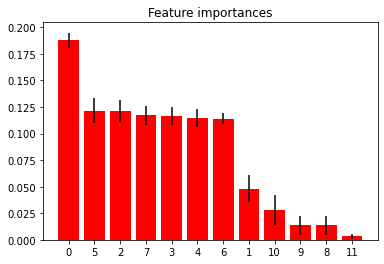

In [67]:
from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier

# Build a forest and compute the feature importances
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

forest.fit(x, y)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(x.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(x.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(x.shape[1]), indices)
plt.xlim([-1, x.shape[1]])
plt.show()

Confusion Matrix:
 [[142   0   0   0]
 [  0 675   2   0]
 [  0   5 901   0]
 [  0   0   3 204]]
Accuracy: 99.0 %
Precision Score: 99.0 %
Recall Score: 99.0 %
F1 Score: 99.0 %

The classification report for ExtraTreesClassifier is:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       142
           2       0.99      1.00      0.99       677
           3       0.99      0.99      0.99       906
           4       1.00      0.99      0.99       207

    accuracy                           0.99      1932
   macro avg       1.00      0.99      1.00      1932
weighted avg       0.99      0.99      0.99      1932



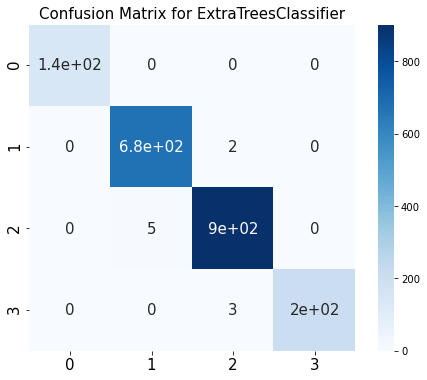

In [70]:
forest.score(x_test, y_test)
y_pred_forest = forest.predict(x_test)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_forest))
print("Accuracy:", round(accuracy_score(y_test, y_pred_forest),2)*100,"%")
print("Precision Score:", round(precision_score(y_test, y_pred_forest, average="weighted"),2)*100,"%")
print("Recall Score:", round(recall_score(y_test, y_pred_forest, average="weighted"),2)*100,"%")
print("F1 Score:", round(f1_score(y_test, y_pred_forest, average="weighted"), 2)*100,"%")
generate_results(forest, y_pred_forest, 'ExtraTreesClassifier')

In [71]:
#Create a function to return the prediction results for 7 models:
def generate_7_models(df):
    result = pd.DataFrame({'Rfc' : rfc.predict(df), 'Clf': clf.predict(df), 'Passive_Aggressive': model_passagg.predict(df), 'SGD Classifier': model.predict(df),'Gradient Boosting':model.predict(df),'Bagging Classifier':bag_model.predict(df),'ExtraTreesClassifier':forest.predict(df)})
    price_group = pd.DataFrame({"1":"< 50 EUR", "2":"< 100 EUR","3":"< 300 EUR","4":"Over 3O0 EUR"},index=[0])
    print(price_group)
    return result


In [72]:
generate_7_models(test_x_1)

          1          2          3             4
0  < 50 EUR  < 100 EUR  < 300 EUR  Over 3O0 EUR


,Rfc,Clf,Passive_Aggressive,SGD Classifier,Gradient Boosting,Bagging Classifier,ExtraTreesClassifier
0,2,2,2,2,2,2,2


In [73]:
generate_7_models(cosy)

          1          2          3             4
0  < 50 EUR  < 100 EUR  < 300 EUR  Over 3O0 EUR


,Rfc,Clf,Passive_Aggressive,SGD Classifier,Gradient Boosting,Bagging Classifier,ExtraTreesClassifier
0,3,2,2,3,3,2,2


In [74]:
generate_7_models(jaccuzi)

          1          2          3             4
0  < 50 EUR  < 100 EUR  < 300 EUR  Over 3O0 EUR


,Rfc,Clf,Passive_Aggressive,SGD Classifier,Gradient Boosting,Bagging Classifier,ExtraTreesClassifier
0,4,4,4,4,4,3,3


In [75]:
y_pred_forest

array([3, 2, 4, ..., 1, 1, 1], dtype=int64)

In [79]:
arr = y_test.astype('float64')

In [80]:
check = y_pred_forest - arr

In [81]:
check.value_counts()

 0.0    1922
-1.0       8
 1.0       2
Name: price_group, dtype: int64